# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

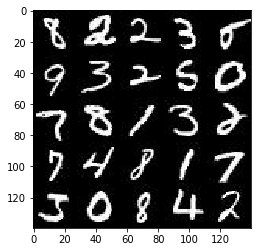

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

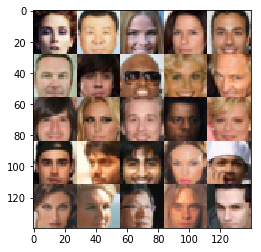

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name='input')
    z_data = tf.placeholder(tf.float32, [None, z_dim], name='z_data')
    learn_rate = tf.placeholder(tf.float32, name='learning_rate')
    return inputs, z_data, learn_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/home/jigor/.conda/envs/dlnd/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/home/jigor/.conda/envs/dlnd/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/home/jigor/.conda/envs/dlnd/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/home/jigor/.conda/envs/dlnd/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/home/jigor/.conda/envs/dlnd/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 477, in start\n    ioloop.IOLoop.instance().start()', 'File "/home/jigor/.conda/envs/dlnd/lib/p

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [75]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    
    with tf.variable_scope('discriminator', reuse=reuse):
        #28x28x3
        #X = tf.layers.dropout(images,rate=0.4,training=True)
        X = tf.layers.conv2d(images, filters=256,strides=2,kernel_size=5, padding='same')
        #X = tf.layers.dropout(X,rate=0.6,training=True)
        X = tf.layers.batch_normalization(X,  training=True)
        X = tf.maximum(0.2*X,X)
        #14x14x64
        #X = tf.layers.dropout(X,rate=0.5,training=True)
        #X = tf.layers.average_pooling2d(X,pool_size=3,padding='same',strides=2)#on
        X = tf.layers.conv2d(X, filters=512, strides=1, kernel_size=5, padding='same')
        ##X = tf.layers.dropout(X,rate=0.6,training=True)
        X = tf.layers.batch_normalization(X, training=True)#off
        X = tf.maximum(0.2*X,X)
        #7x7x128
        
        #X = tf.layers.dropout(X,rate=0.5,training=True)
        #X = tf.layers.average_pooling2d(X,pool_size=5,padding='same',strides=1)
        X = tf.layers.conv2d(X, filters=1024, strides=2, kernel_size=5, padding='same')
        
        #X = tf.layers.batch_normalization(X, training=True)
        X = tf.maximum(0.2*X,X)
        X = tf.layers.max_pooling2d(X,pool_size=5,padding='same',strides=2)
        #4x4x256
        #X = tf.layers.dropout(X,rate=0.4,training=True)
        #X = tf.layers.conv2d(X, filters=512, strides=1, kernel_size=5, padding='same')
        ###X = tf.layers.batch_normalization(X, training=True)
        #X = tf.maximum(0.2*X,X)
        
        #X = tf.layers.conv2d(X, filters=512, strides=1, kernel_size=5, padding='same')
        #X = tf.layers.batch_normalization(X, training=True)
        #X = tf.maximum(0.2*X,X)
        
        
        
        #X = tf.reduce_mean(X, (1,2))
        #logits = tf.reduce_mean(X, (1),keep_dims=True)
        #out = tf.sigmoid(logits)
        X = tf.reshape(X,(-1,1024))
        logits = tf.layers.dense(X, 1, activation=None)        
        out = tf.sigmoid(logits)
        #
        
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [47]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.05
    with tf.variable_scope('generator', reuse= not is_train):
        X = tf.layers.dense(z, 7*7*512)
        
        X = tf.reshape(X, (-1,7,7,512))
        X = tf.layers.batch_normalization(X,training=is_train)
        X = tf.maximum(alpha*X,X)
        
        X = tf.layers.conv2d_transpose(X, filters=256, kernel_size=5, strides=2, padding='same')
        X = tf.layers.batch_normalization(X, training=is_train)
        X = tf.maximum(alpha*X, X)
        
        X = tf.layers.conv2d_transpose(X, filters=128, kernel_size=5, strides=2, padding='same')
        X = tf.layers.batch_normalization(X, training=is_train)
        X = tf.maximum(alpha*X,X)
        
        out = tf.layers.conv2d_transpose(X, filters=out_channel_dim, kernel_size=5, strides=1, padding='same')                        
        out = tf.tanh(out)
        
        #X = tf.layers.dense(z, 3*3*512)
        
        #X = tf.reshape(X, (-1,3,3,512))
        #X = tf.layers.batch_normalization(X,training=is_train)
        #X = tf.maximum(alpha*X,X)
        
        #X = tf.layers.conv2d_transpose(X, filters=512, kernel_size=5, strides=2, padding='same')
        #X = tf.layers.batch_normalization(X, training=is_train)
        #X = tf.maximum(alpha*X, X)
        
        #X = tf.layers.conv2d_transpose(X, filters=256, kernel_size=5, strides=2, padding='same')
        #X = tf.layers.batch_normalization(X, training=is_train)
        #X = tf.maximum(alpha*X,X)
        
        #X = tf.layers.conv2d_transpose(X, filters=128, kernel_size=5, strides=2, padding='same')
        #X = tf.layers.batch_normalization(X, training=is_train)
        #X = tf.maximum(alpha*X,X)
        
        #X = tf.layers.conv2d_transpose(X, filters=128, kernel_size=5, strides=1, padding='same')
        #X = tf.layers.batch_normalization(X, training=is_train)
        ##X = tf.layers.dropout(X,0.5)
        #X = tf.maximum(alpha*X,X)
        
        #X = tf.layers.conv2d_transpose(X, filters=64, kernel_size=5, strides=1, padding='same')
        #X = tf.layers.batch_normalization(X, training=is_train)
        #X = tf.layers.dropout(X,0.5)
        #X = tf.maximum(alpha*X,X)
        
        #logits = tf.layers.conv2d_transpose(X, filters=out_channel_dim, kernel_size=5, strides=1, padding='valid')                        
        #out  = tf.tanh(logits)
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [27]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_out = generator(z=input_z, out_channel_dim=out_channel_dim, is_train=True)
    dr_out, dr_logits = discriminator(input_real,reuse=False)
    df_out, df_logits = discriminator(g_out,reuse=True)
    
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.ones_like(df_logits), logits=df_logits))
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.zeros_like(df_logits), logits=df_logits))
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(labels=tf.ones_like(dr_logits)*0.9, logits=dr_logits))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [28]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    train_var = tf.trainable_variables()
    g_var = [x for x in train_var if x.name.startswith('generator')]
    d_var = [x for x in train_var if x.name.startswith('discriminator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_var)
        g_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_var)
    
    
    return d_opt, g_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [29]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [30]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    print(data_shape)
    _, image_width, image_height, image_channels = data_shape
                                                                                                   
    inputs, z_input, learn_rate = model_inputs(image_width,image_height,image_channels,z_dim)
    
    out_chanel_dim = image_channels
    
    d_loss, g_loss = model_loss(inputs,z_input, out_chanel_dim)
    
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            counter=0            
            d_loss_list=[]
            g_loss_list=[]
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                batch_images = batch_images * 2
                #zi = tf.random_uniform_initializer(-1,1)((batch_size,z_dim))                
                zi = np.random.uniform(-1,1,(batch_size,z_dim))    
               
                sess.run([d_opt,g_opt], feed_dict={inputs:batch_images,
                                                   z_input:zi,
                                                   learn_rate:learning_rate})
                #sess.run([g_opt,g_opt,g_opt] ,feed_dict={inputs:batch_images,
                #                                   z_input:zi,
                #                                   learn_rate:learning_rate})                
                
                
                    
                d,g = sess.run([d_loss, g_loss],feed_dict={inputs:batch_images,
                                                   z_input:zi,
                                                   learn_rate:learning_rate})
                d_loss_list.append(d)
                g_loss_list.append(g)
                
                if counter % 100 == 0:                    
                    show_generator_output(sess,25,z_input, out_chanel_dim, data_image_mode)
                    print("epoch=" + str(epoch_i) +
                          " batch=" + str(counter) + 
                          " d_loss="+str(np.mean(d_loss_list)) + 
                          " g_loss="+str(np.mean(g_loss_list)))
                
                counter+=1            
        print("Finished")
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

(60000, 28, 28, 1)


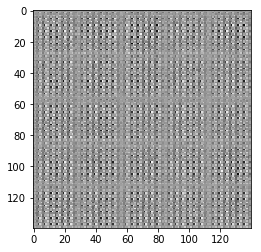

epoch=0 batch=0 d_loss=1.84337 g_loss=6.73007


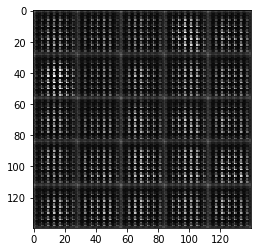

epoch=0 batch=100 d_loss=1.10176 g_loss=19.964


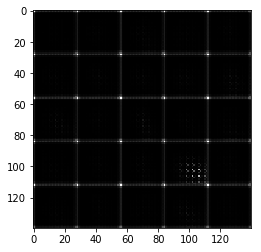

epoch=0 batch=200 d_loss=0.741219 g_loss=13.3528


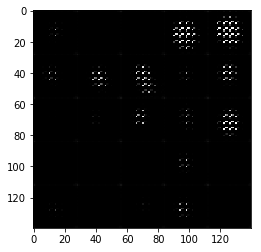

epoch=0 batch=300 d_loss=0.679948 g_loss=11.2992


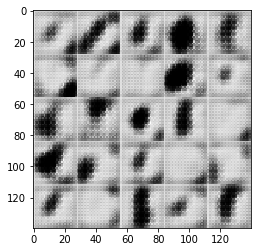

epoch=0 batch=400 d_loss=0.638426 g_loss=9.7466


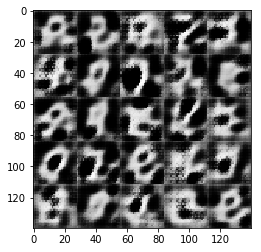

epoch=0 batch=500 d_loss=0.738065 g_loss=8.18602


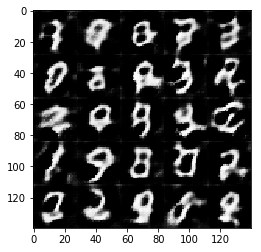

epoch=0 batch=600 d_loss=0.820851 g_loss=7.0359


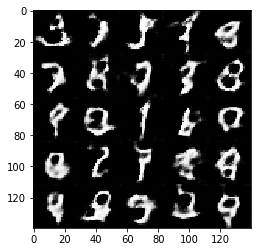

epoch=0 batch=700 d_loss=0.875634 g_loss=6.19967


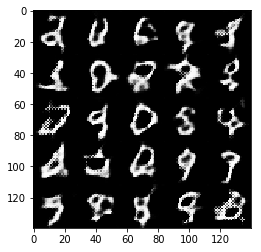

epoch=0 batch=800 d_loss=0.91409 g_loss=5.5767


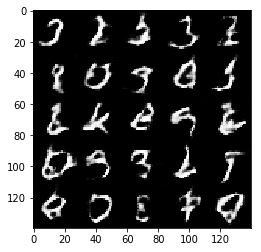

epoch=0 batch=900 d_loss=0.941393 g_loss=5.0902


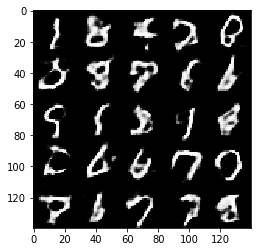

epoch=0 batch=1000 d_loss=0.961909 g_loss=4.69939


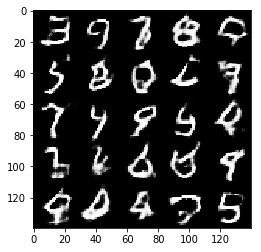

epoch=0 batch=1100 d_loss=0.977809 g_loss=4.38001


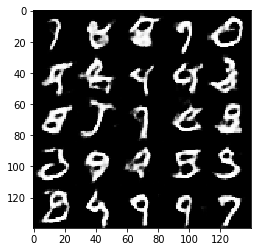

epoch=0 batch=1200 d_loss=0.989376 g_loss=4.11986


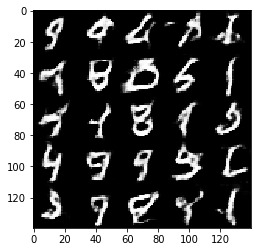

epoch=0 batch=1300 d_loss=0.997405 g_loss=3.89665


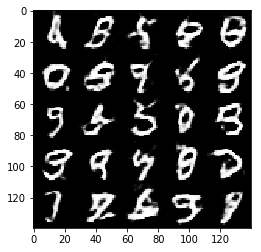

epoch=0 batch=1400 d_loss=1.0016 g_loss=3.71238


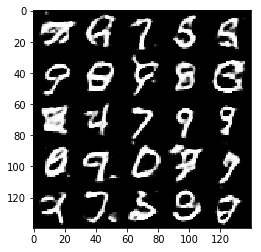

epoch=0 batch=1500 d_loss=1.0066 g_loss=3.55433


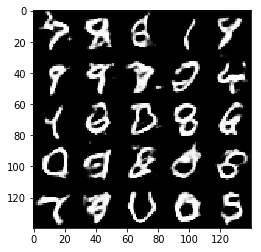

epoch=0 batch=1600 d_loss=1.00682 g_loss=3.41667


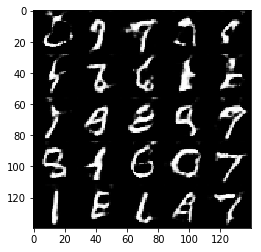

epoch=0 batch=1700 d_loss=1.00977 g_loss=3.30379


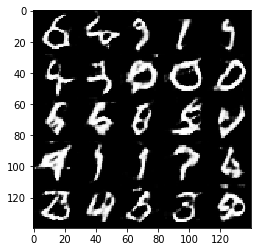

epoch=0 batch=1800 d_loss=1.0075 g_loss=3.19842


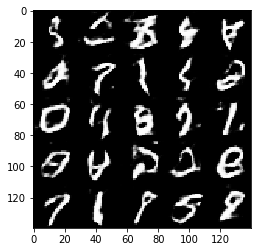

epoch=0 batch=1900 d_loss=1.00635 g_loss=3.11173


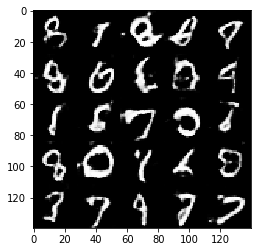

epoch=0 batch=2000 d_loss=1.00372 g_loss=3.03464


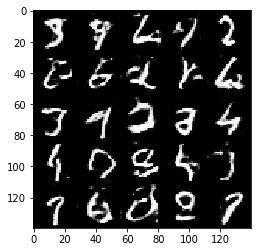

epoch=0 batch=2100 d_loss=0.999184 g_loss=2.96855


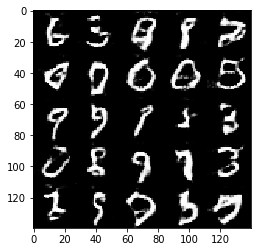

epoch=0 batch=2200 d_loss=0.994426 g_loss=2.91188


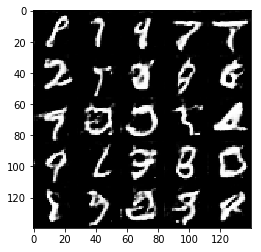

epoch=0 batch=2300 d_loss=0.98957 g_loss=2.86207


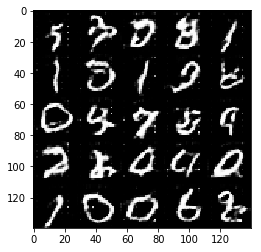

epoch=0 batch=2400 d_loss=0.984781 g_loss=2.81725


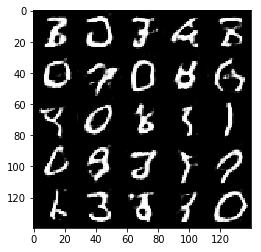

epoch=0 batch=2500 d_loss=0.98261 g_loss=2.7748


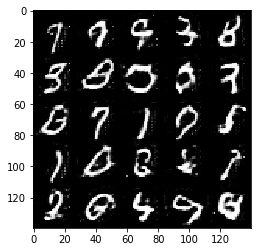

epoch=0 batch=2600 d_loss=0.979608 g_loss=2.72896


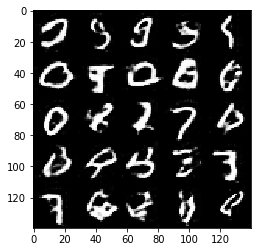

epoch=0 batch=2700 d_loss=0.979507 g_loss=2.68402


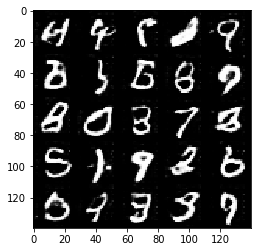

epoch=0 batch=2800 d_loss=0.97946 g_loss=2.64149


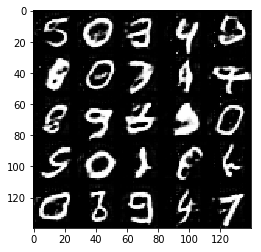

epoch=0 batch=2900 d_loss=0.978039 g_loss=2.60305


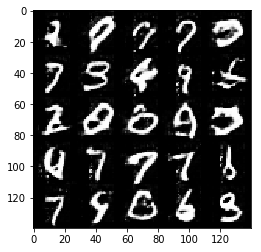

epoch=0 batch=3000 d_loss=0.976972 g_loss=2.568


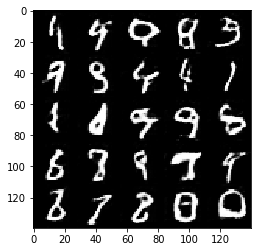

epoch=0 batch=3100 d_loss=0.97528 g_loss=2.53397


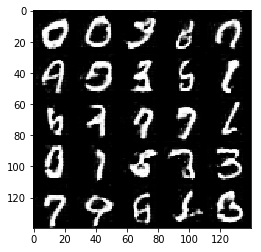

epoch=0 batch=3200 d_loss=0.973361 g_loss=2.50426


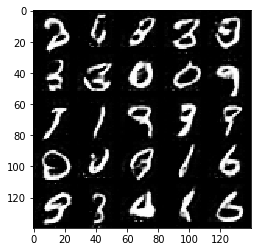

epoch=0 batch=3300 d_loss=0.972108 g_loss=2.47692


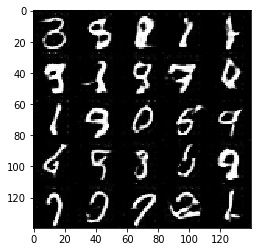

epoch=0 batch=3400 d_loss=0.970058 g_loss=2.44875


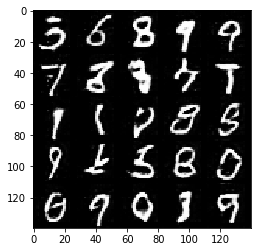

epoch=0 batch=3500 d_loss=0.969764 g_loss=2.42221


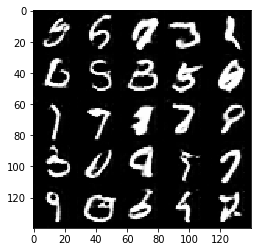

epoch=0 batch=3600 d_loss=0.968753 g_loss=2.397


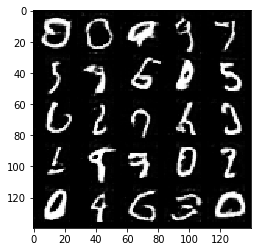

epoch=0 batch=3700 d_loss=0.967528 g_loss=2.37397


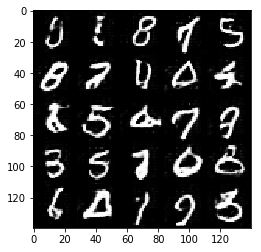

epoch=1 batch=0 d_loss=0.749978 g_loss=2.14009


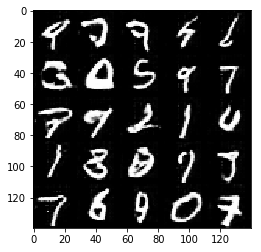

epoch=1 batch=100 d_loss=0.889397 g_loss=1.55278


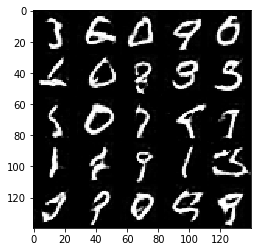

epoch=1 batch=200 d_loss=0.899843 g_loss=1.54473


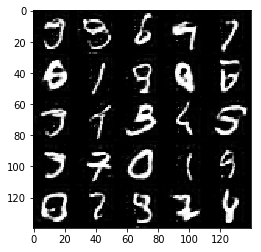

epoch=1 batch=300 d_loss=0.894478 g_loss=1.54891


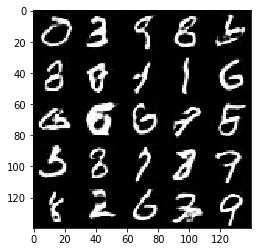

epoch=1 batch=400 d_loss=0.893441 g_loss=1.56647


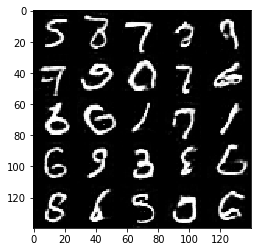

epoch=1 batch=500 d_loss=0.892439 g_loss=1.56107


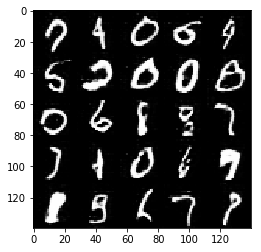

epoch=1 batch=600 d_loss=0.891589 g_loss=1.56595


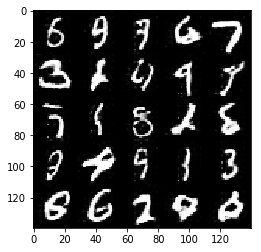

epoch=1 batch=700 d_loss=0.8912 g_loss=1.57573


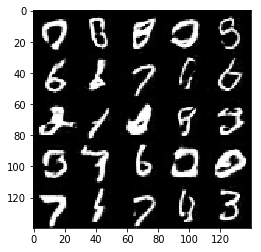

epoch=1 batch=800 d_loss=0.888309 g_loss=1.58441


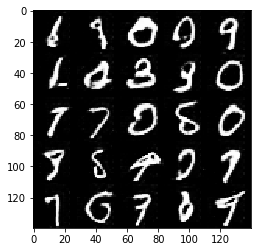

epoch=1 batch=900 d_loss=0.884318 g_loss=1.5913


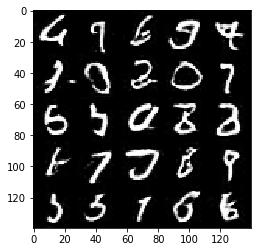

epoch=1 batch=1000 d_loss=0.883494 g_loss=1.58904


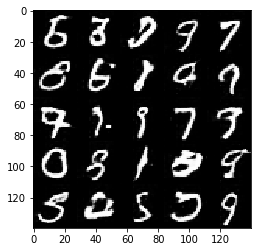

epoch=1 batch=1100 d_loss=0.882331 g_loss=1.59181


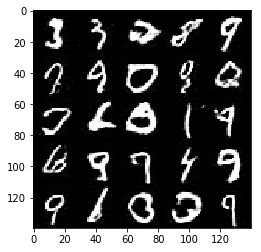

epoch=1 batch=1200 d_loss=0.879861 g_loss=1.59406


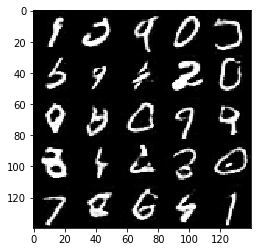

epoch=1 batch=1300 d_loss=0.880573 g_loss=1.58928


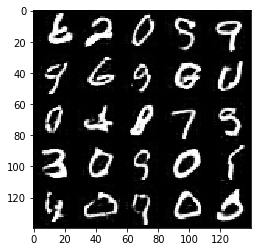

epoch=1 batch=1400 d_loss=0.879868 g_loss=1.59027


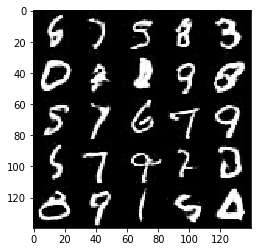

epoch=1 batch=1500 d_loss=0.879652 g_loss=1.58692


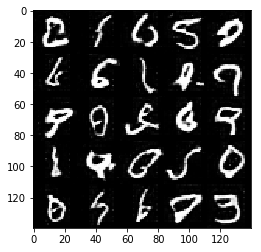

epoch=1 batch=1600 d_loss=0.878941 g_loss=1.58827


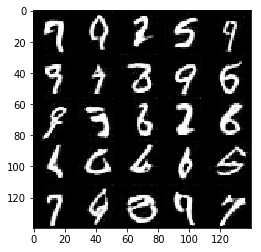

epoch=1 batch=1700 d_loss=0.879735 g_loss=1.58746


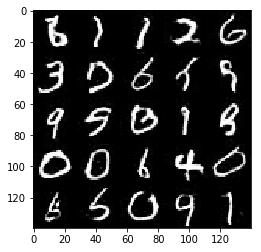

epoch=1 batch=1800 d_loss=0.878837 g_loss=1.58624


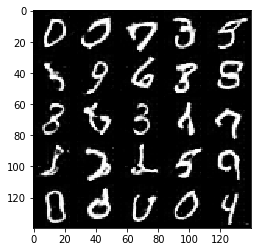

epoch=1 batch=1900 d_loss=0.878995 g_loss=1.5831


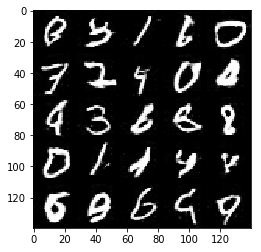

epoch=1 batch=2000 d_loss=0.879196 g_loss=1.5803


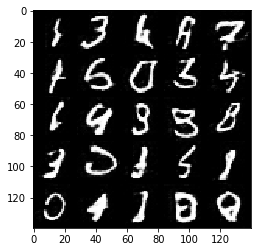

epoch=1 batch=2100 d_loss=0.878626 g_loss=1.58198


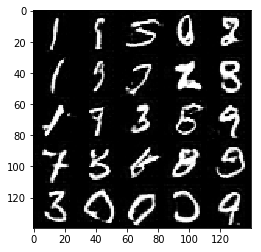

epoch=1 batch=2200 d_loss=0.878875 g_loss=1.58114


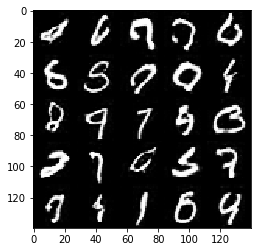

epoch=1 batch=2300 d_loss=0.87859 g_loss=1.57876


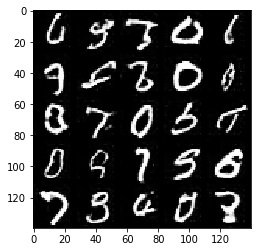

epoch=1 batch=2400 d_loss=0.878579 g_loss=1.57943


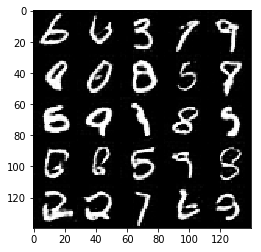

epoch=1 batch=2500 d_loss=0.878538 g_loss=1.57813


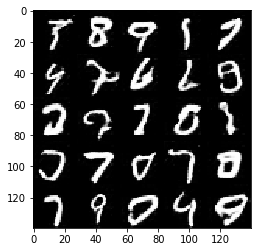

epoch=1 batch=2600 d_loss=0.878089 g_loss=1.57814


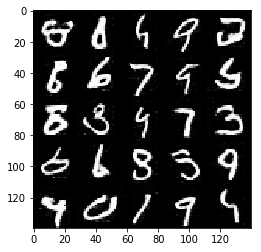

epoch=1 batch=2700 d_loss=0.877934 g_loss=1.57774


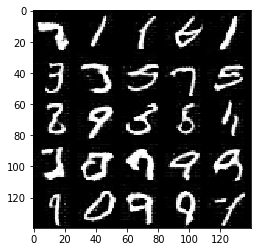

epoch=1 batch=2800 d_loss=0.878474 g_loss=1.57568


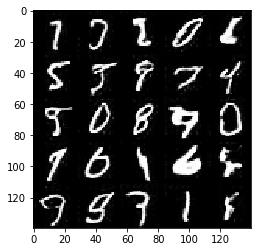

epoch=1 batch=2900 d_loss=0.878719 g_loss=1.57342


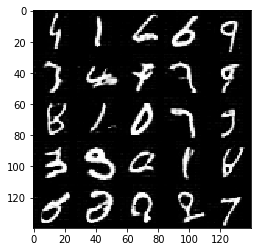

epoch=1 batch=3000 d_loss=0.878273 g_loss=1.57375


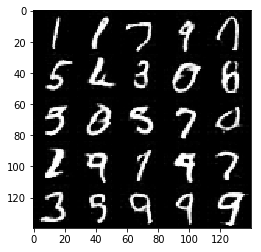

epoch=1 batch=3100 d_loss=0.878111 g_loss=1.57398


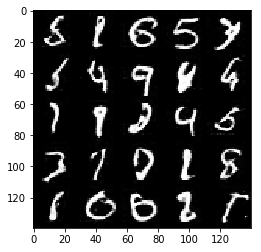

epoch=1 batch=3200 d_loss=0.877693 g_loss=1.57325


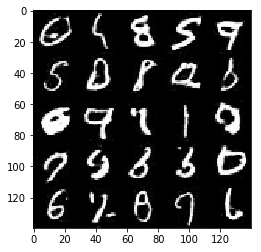

epoch=1 batch=3300 d_loss=0.87756 g_loss=1.57284


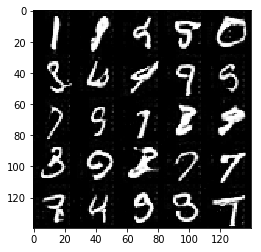

epoch=1 batch=3400 d_loss=0.876826 g_loss=1.5725


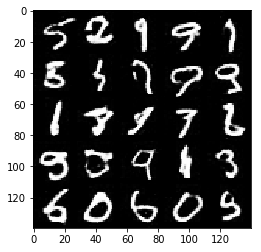

epoch=1 batch=3500 d_loss=0.878113 g_loss=1.5714


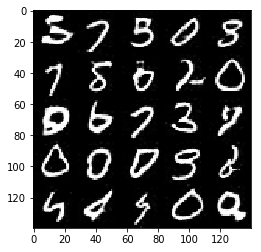

epoch=1 batch=3600 d_loss=0.878517 g_loss=1.57007


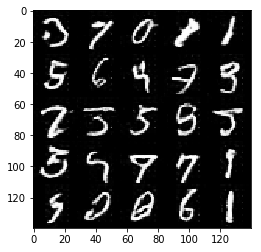

epoch=1 batch=3700 d_loss=0.878 g_loss=1.56902
Finished


In [77]:
batch_size = 16
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

(202599, 28, 28, 3)


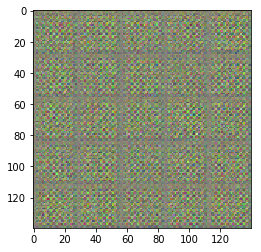

epoch=0 batch=0 d_loss=9.6254 g_loss=9.56771


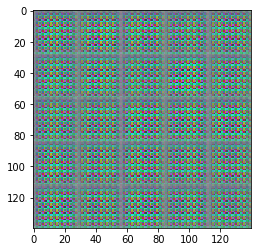

epoch=0 batch=100 d_loss=0.6071 g_loss=6.10628


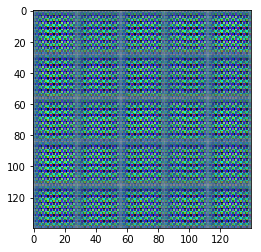

epoch=0 batch=200 d_loss=0.509125 g_loss=6.31926


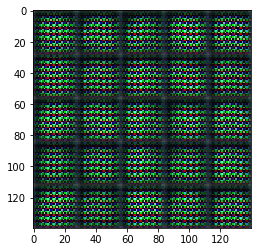

epoch=0 batch=300 d_loss=0.474875 g_loss=7.04358


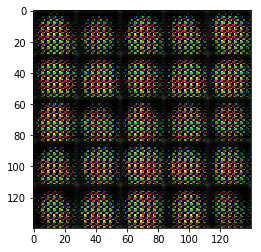

epoch=0 batch=400 d_loss=0.448363 g_loss=6.99986


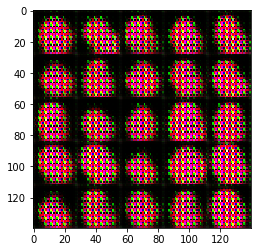

epoch=0 batch=500 d_loss=0.427401 g_loss=6.92844


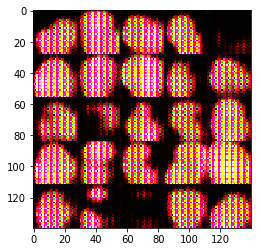

epoch=0 batch=600 d_loss=0.447073 g_loss=6.93641


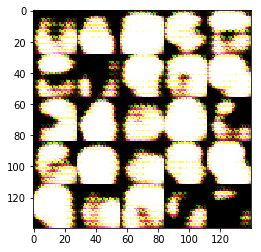

epoch=0 batch=700 d_loss=0.445358 g_loss=6.59577


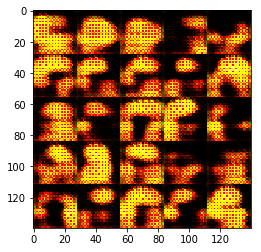

epoch=0 batch=800 d_loss=0.437913 g_loss=6.30327


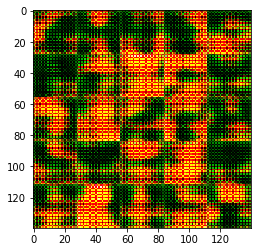

epoch=0 batch=900 d_loss=0.427649 g_loss=6.25185


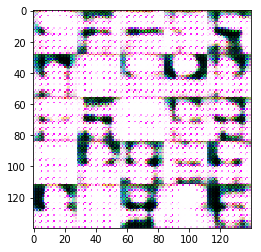

epoch=0 batch=1000 d_loss=0.422366 g_loss=6.15296


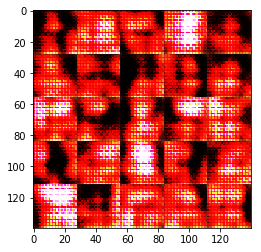

epoch=0 batch=1100 d_loss=0.425065 g_loss=5.99148


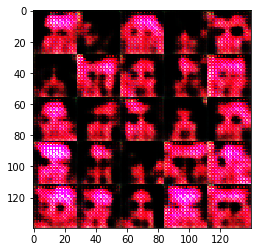

epoch=0 batch=1200 d_loss=0.423307 g_loss=5.87082


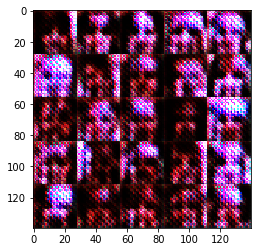

epoch=0 batch=1300 d_loss=0.432891 g_loss=5.75279


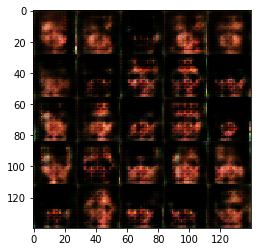

epoch=0 batch=1400 d_loss=0.437544 g_loss=5.63013


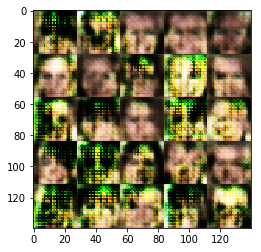

epoch=0 batch=1500 d_loss=0.447797 g_loss=5.49784


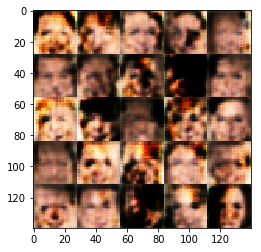

epoch=0 batch=1600 d_loss=0.456435 g_loss=5.37798


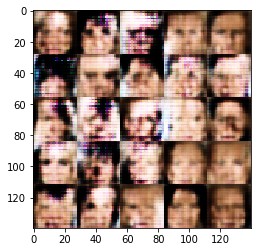

epoch=0 batch=1700 d_loss=0.463217 g_loss=5.28016


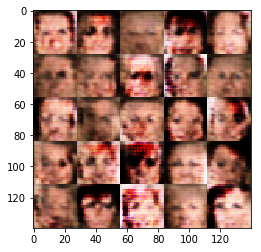

epoch=0 batch=1800 d_loss=0.470001 g_loss=5.18332


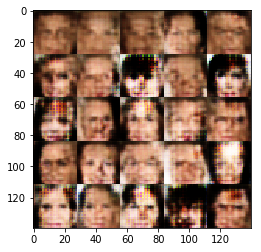

epoch=0 batch=1900 d_loss=0.47405 g_loss=5.09318


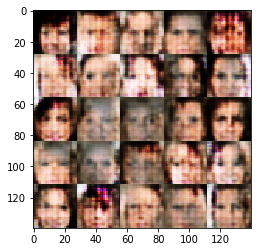

epoch=0 batch=2000 d_loss=0.479964 g_loss=5.01694


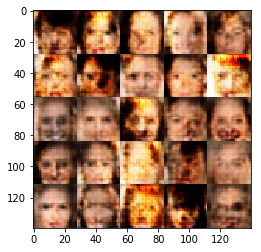

epoch=0 batch=2100 d_loss=0.48511 g_loss=4.92411


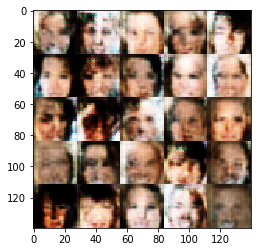

epoch=0 batch=2200 d_loss=0.489505 g_loss=4.84226


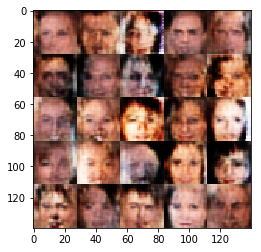

epoch=0 batch=2300 d_loss=0.496365 g_loss=4.75984


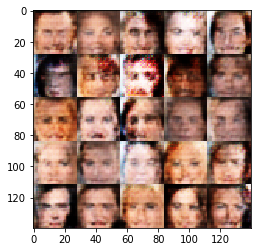

epoch=0 batch=2400 d_loss=0.504719 g_loss=4.67322


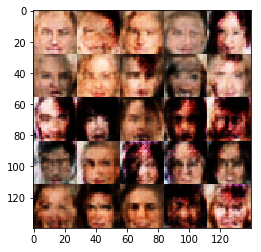

epoch=0 batch=2500 d_loss=0.509979 g_loss=4.60368


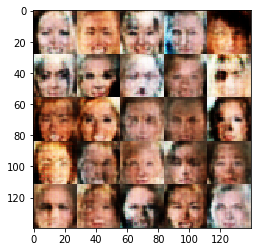

epoch=0 batch=2600 d_loss=0.517071 g_loss=4.53252


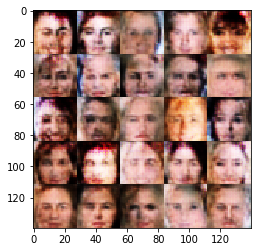

epoch=0 batch=2700 d_loss=0.522882 g_loss=4.46813


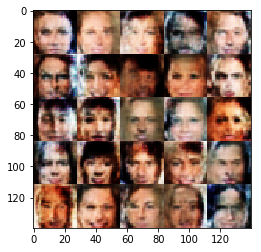

epoch=0 batch=2800 d_loss=0.527101 g_loss=4.40915


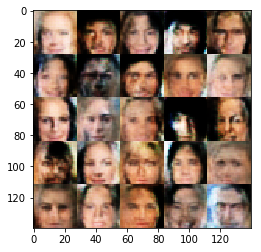

epoch=0 batch=2900 d_loss=0.530639 g_loss=4.35524


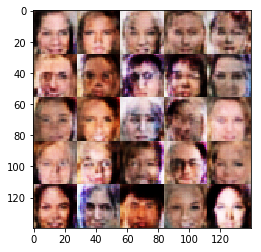

epoch=0 batch=3000 d_loss=0.535818 g_loss=4.29695


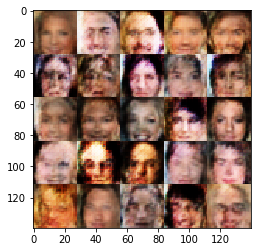

epoch=0 batch=3100 d_loss=0.540759 g_loss=4.23645


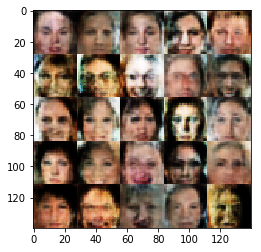

epoch=0 batch=3200 d_loss=0.545775 g_loss=4.19281


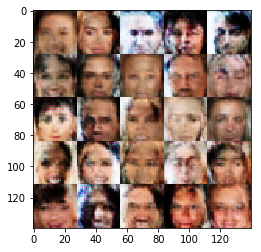

epoch=0 batch=3300 d_loss=0.552478 g_loss=4.13864


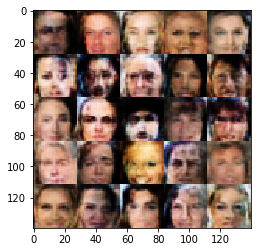

epoch=0 batch=3400 d_loss=0.555762 g_loss=4.09288


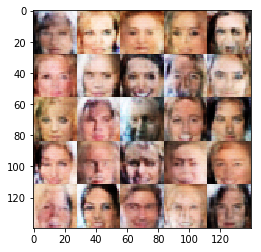

epoch=0 batch=3500 d_loss=0.559281 g_loss=4.04913


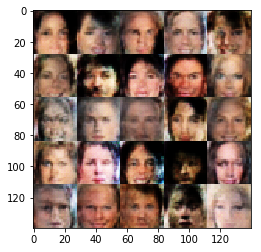

epoch=0 batch=3600 d_loss=0.563902 g_loss=4.00689


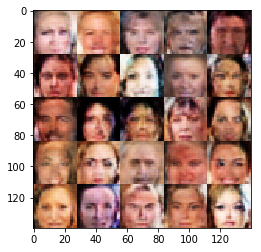

epoch=0 batch=3700 d_loss=0.56777 g_loss=3.96375


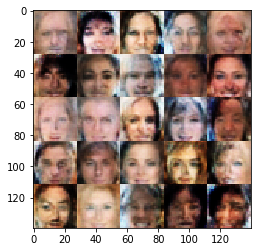

epoch=0 batch=3800 d_loss=0.570707 g_loss=3.92395


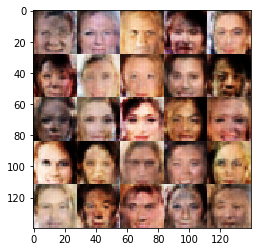

epoch=0 batch=3900 d_loss=0.573998 g_loss=3.88471


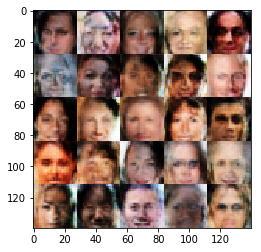

epoch=0 batch=4000 d_loss=0.576898 g_loss=3.85187


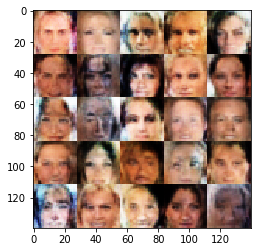

epoch=0 batch=4100 d_loss=0.580145 g_loss=3.81808


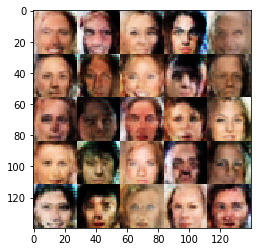

epoch=0 batch=4200 d_loss=0.582386 g_loss=3.78547


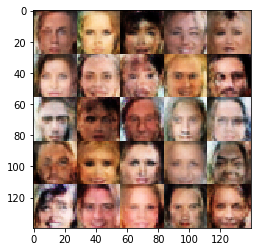

epoch=0 batch=4300 d_loss=0.585831 g_loss=3.75325


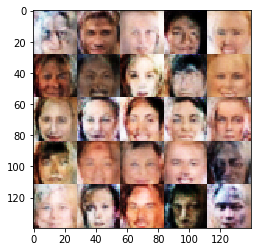

epoch=0 batch=4400 d_loss=0.589025 g_loss=3.72387


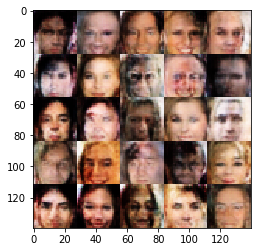

epoch=0 batch=4500 d_loss=0.591523 g_loss=3.69443


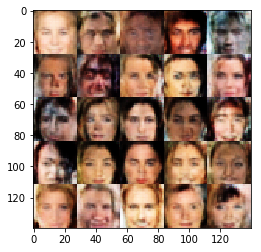

epoch=0 batch=4600 d_loss=0.594002 g_loss=3.6671


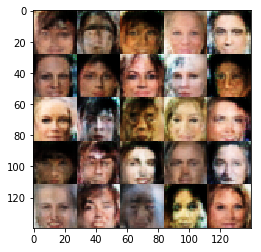

epoch=0 batch=4700 d_loss=0.595944 g_loss=3.63942


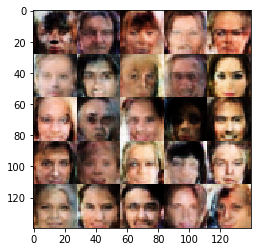

epoch=0 batch=4800 d_loss=0.599606 g_loss=3.61422


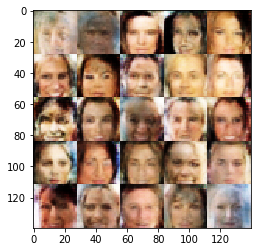

epoch=0 batch=4900 d_loss=0.601262 g_loss=3.58731


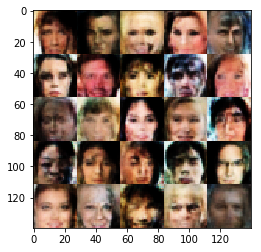

epoch=0 batch=5000 d_loss=0.603245 g_loss=3.56291


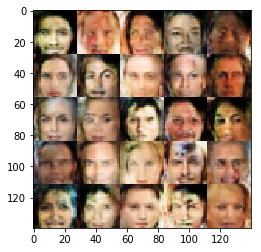

epoch=0 batch=5100 d_loss=0.605098 g_loss=3.53874


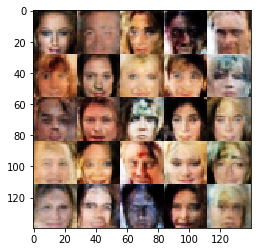

epoch=0 batch=5200 d_loss=0.608127 g_loss=3.51222


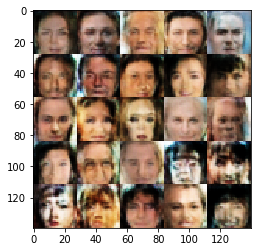

epoch=0 batch=5300 d_loss=0.609991 g_loss=3.48917


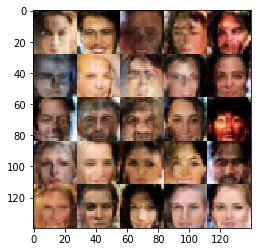

epoch=0 batch=5400 d_loss=0.612011 g_loss=3.46705


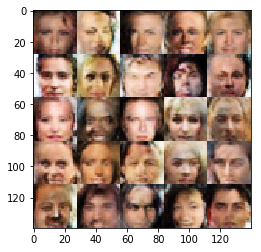

epoch=0 batch=5500 d_loss=0.613941 g_loss=3.44362


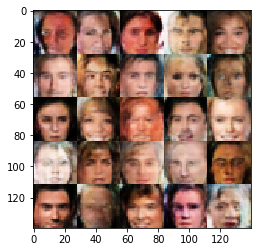

epoch=0 batch=5600 d_loss=0.614796 g_loss=3.42384


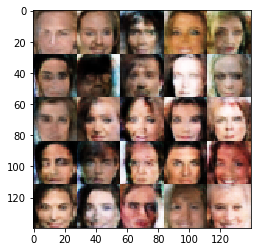

epoch=0 batch=5700 d_loss=0.616746 g_loss=3.40438


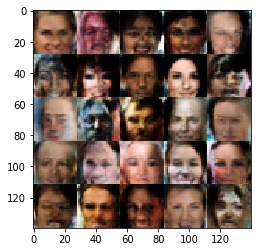

epoch=0 batch=5800 d_loss=0.618045 g_loss=3.38424


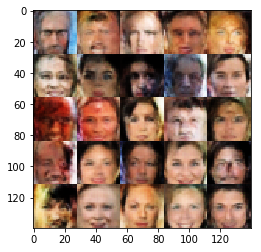

epoch=0 batch=5900 d_loss=0.61984 g_loss=3.36494


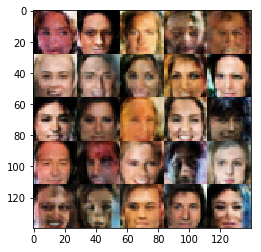

epoch=0 batch=6000 d_loss=0.621162 g_loss=3.34719


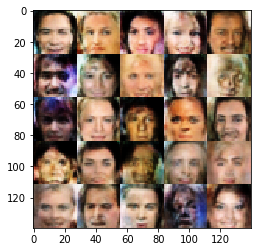

epoch=0 batch=6100 d_loss=0.622901 g_loss=3.33016


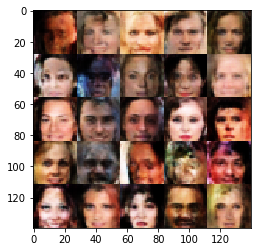

epoch=0 batch=6200 d_loss=0.623968 g_loss=3.31374


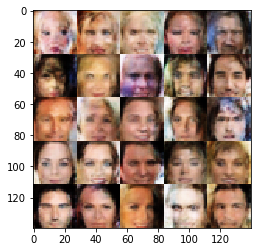

epoch=0 batch=6300 d_loss=0.626541 g_loss=3.29569


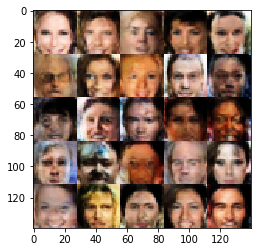

epoch=0 batch=6400 d_loss=0.627709 g_loss=3.27981


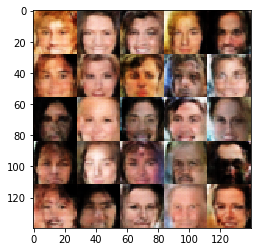

epoch=0 batch=6500 d_loss=0.628455 g_loss=3.26439


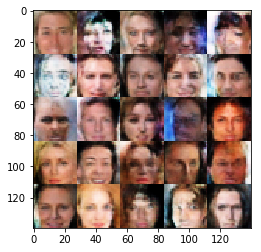

epoch=0 batch=6600 d_loss=0.630117 g_loss=3.2494


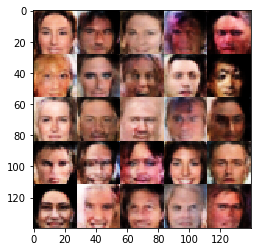

epoch=0 batch=6700 d_loss=0.631067 g_loss=3.23426


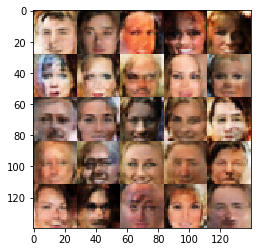

epoch=0 batch=6800 d_loss=0.632423 g_loss=3.21926


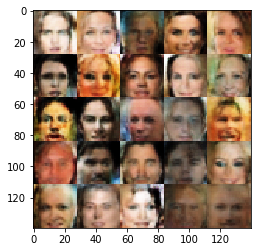

epoch=0 batch=6900 d_loss=0.633386 g_loss=3.2048


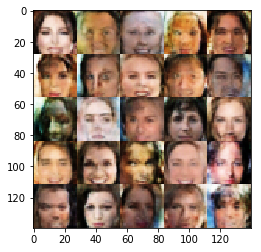

epoch=0 batch=7000 d_loss=0.634735 g_loss=3.19131


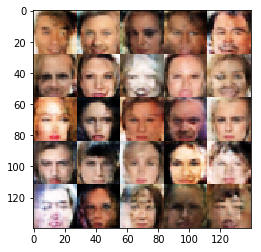

epoch=0 batch=7100 d_loss=0.636428 g_loss=3.17681


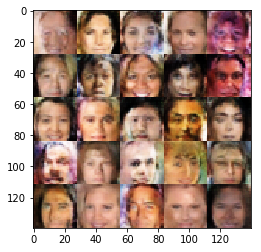

epoch=0 batch=7200 d_loss=0.637554 g_loss=3.16324


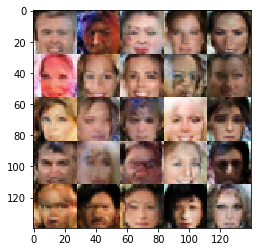

epoch=0 batch=7300 d_loss=0.63873 g_loss=3.14986


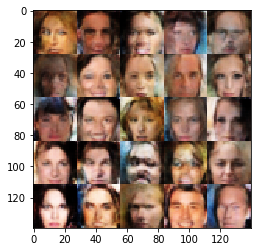

epoch=0 batch=7400 d_loss=0.640216 g_loss=3.13636


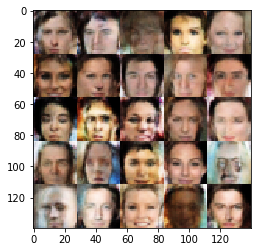

epoch=0 batch=7500 d_loss=0.640801 g_loss=3.12363


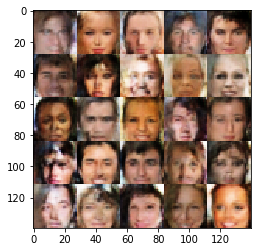

epoch=0 batch=7600 d_loss=0.642174 g_loss=3.1109


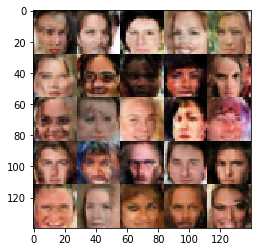

epoch=0 batch=7700 d_loss=0.643018 g_loss=3.09959


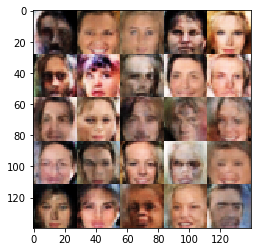

epoch=0 batch=7800 d_loss=0.64453 g_loss=3.08775


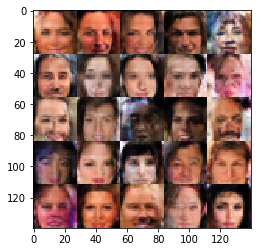

epoch=0 batch=7900 d_loss=0.645525 g_loss=3.07569


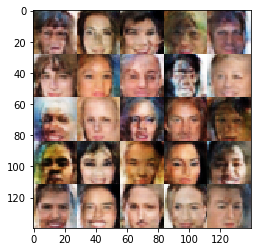

epoch=0 batch=8000 d_loss=0.646016 g_loss=3.06432


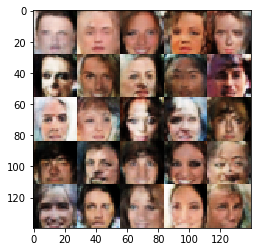

epoch=0 batch=8100 d_loss=0.647291 g_loss=3.05279


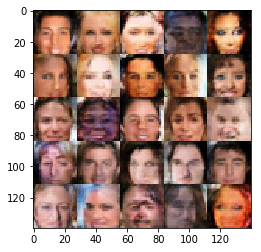

epoch=0 batch=8200 d_loss=0.648645 g_loss=3.04112


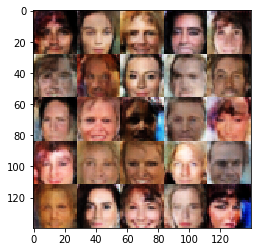

epoch=0 batch=8300 d_loss=0.649728 g_loss=3.02945


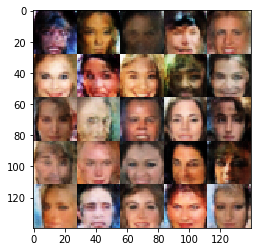

epoch=0 batch=8400 d_loss=0.650359 g_loss=3.01743


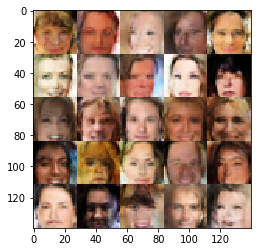

epoch=0 batch=8500 d_loss=0.651306 g_loss=3.00674


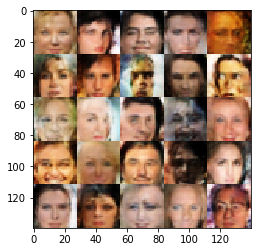

epoch=0 batch=8600 d_loss=0.652451 g_loss=2.99569


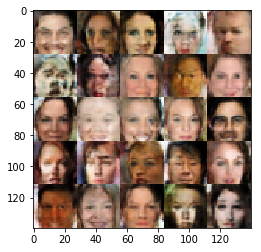

epoch=0 batch=8700 d_loss=0.653452 g_loss=2.98503


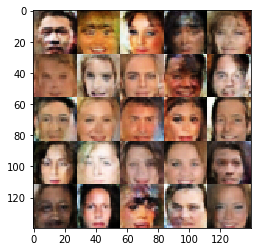

epoch=0 batch=8800 d_loss=0.654446 g_loss=2.97451


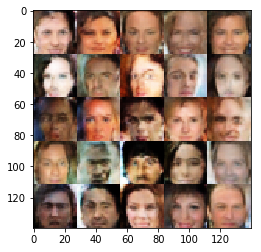

epoch=0 batch=8900 d_loss=0.655358 g_loss=2.96415


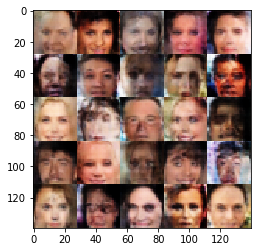

epoch=0 batch=9000 d_loss=0.656533 g_loss=2.95341


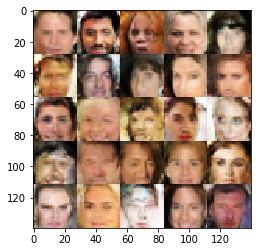

epoch=0 batch=9100 d_loss=0.657576 g_loss=2.94327


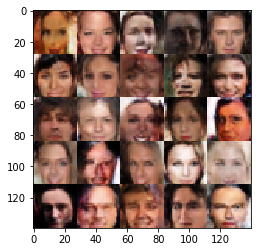

epoch=0 batch=9200 d_loss=0.65859 g_loss=2.9337


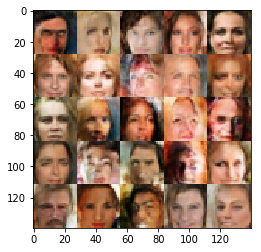

epoch=0 batch=9300 d_loss=0.659279 g_loss=2.92407


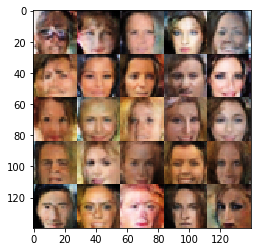

epoch=0 batch=9400 d_loss=0.659947 g_loss=2.91473


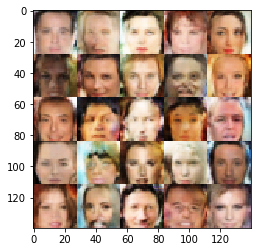

epoch=0 batch=9500 d_loss=0.660779 g_loss=2.90702


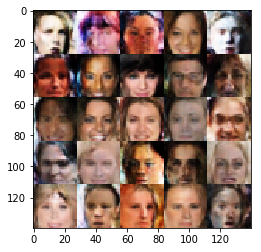

epoch=0 batch=9600 d_loss=0.662389 g_loss=2.89684


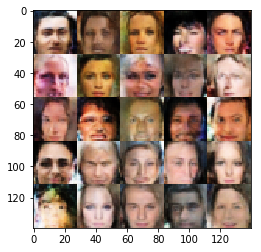

epoch=0 batch=9700 d_loss=0.663102 g_loss=2.88712


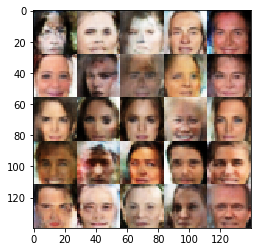

epoch=0 batch=9800 d_loss=0.664325 g_loss=2.87807


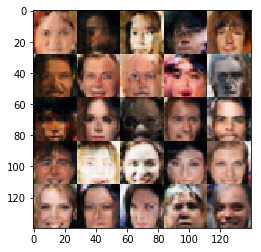

epoch=0 batch=9900 d_loss=0.664345 g_loss=2.86906


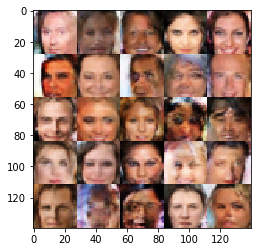

epoch=0 batch=10000 d_loss=0.665219 g_loss=2.86032


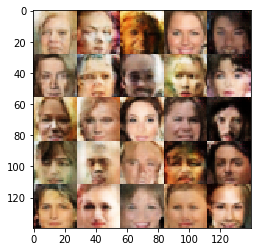

epoch=0 batch=10100 d_loss=0.66606 g_loss=2.85214


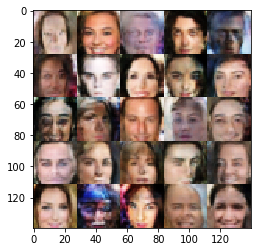

epoch=0 batch=10200 d_loss=0.666758 g_loss=2.84353


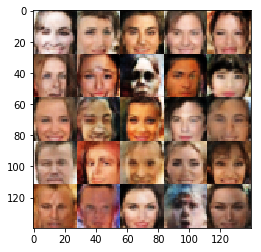

epoch=0 batch=10300 d_loss=0.667387 g_loss=2.83592


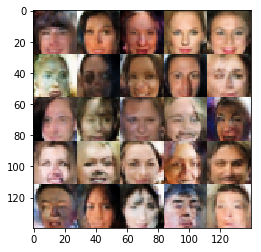

epoch=0 batch=10400 d_loss=0.668436 g_loss=2.82737


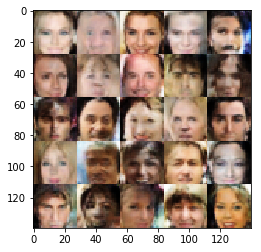

epoch=0 batch=10500 d_loss=0.669174 g_loss=2.81909


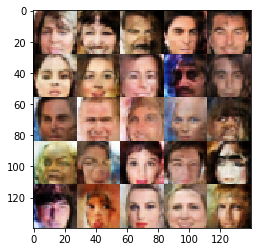

epoch=0 batch=10600 d_loss=0.670083 g_loss=2.81115


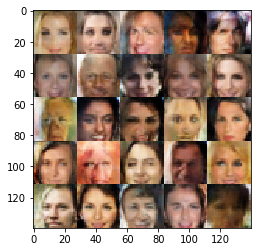

epoch=0 batch=10700 d_loss=0.670668 g_loss=2.80335


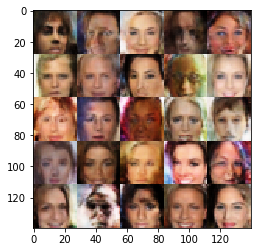

epoch=0 batch=10800 d_loss=0.671184 g_loss=2.79557


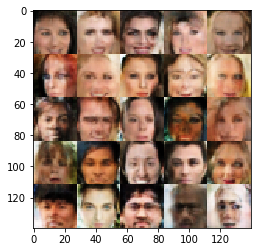

epoch=0 batch=10900 d_loss=0.672403 g_loss=2.78747


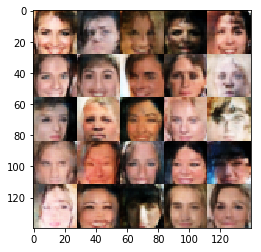

epoch=0 batch=11000 d_loss=0.673073 g_loss=2.78021


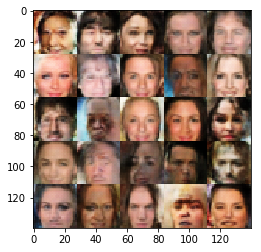

epoch=0 batch=11100 d_loss=0.673812 g_loss=2.77213


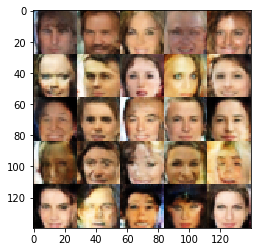

epoch=0 batch=11200 d_loss=0.674651 g_loss=2.76436


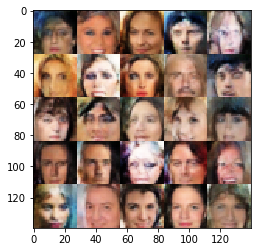

epoch=0 batch=11300 d_loss=0.675194 g_loss=2.75658


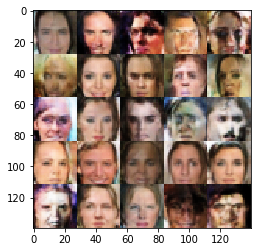

epoch=0 batch=11400 d_loss=0.675817 g_loss=2.74966


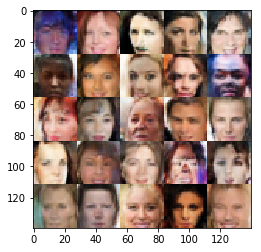

epoch=0 batch=11500 d_loss=0.676503 g_loss=2.74256


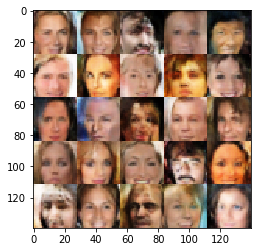

epoch=0 batch=11600 d_loss=0.677356 g_loss=2.7353


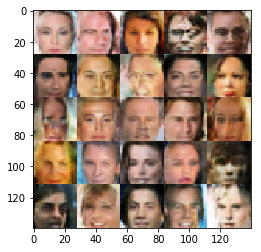

epoch=0 batch=11700 d_loss=0.678115 g_loss=2.72872


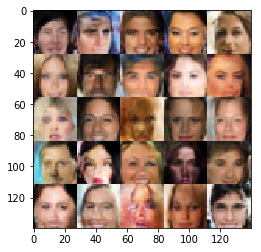

epoch=0 batch=11800 d_loss=0.678618 g_loss=2.72229


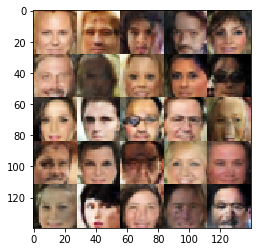

epoch=0 batch=11900 d_loss=0.679709 g_loss=2.71569


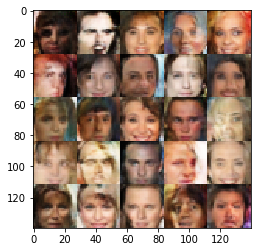

epoch=0 batch=12000 d_loss=0.680409 g_loss=2.70864


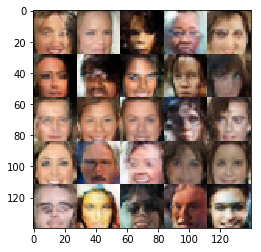

epoch=0 batch=12100 d_loss=0.680952 g_loss=2.70184


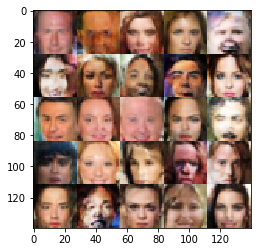

epoch=0 batch=12200 d_loss=0.681944 g_loss=2.69502


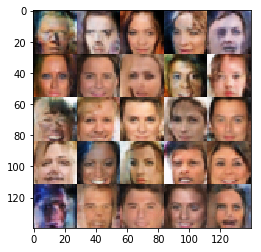

epoch=0 batch=12300 d_loss=0.682744 g_loss=2.688


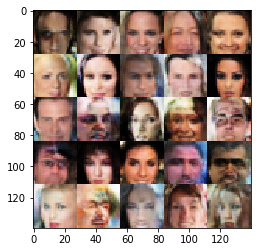

epoch=0 batch=12400 d_loss=0.683494 g_loss=2.68147


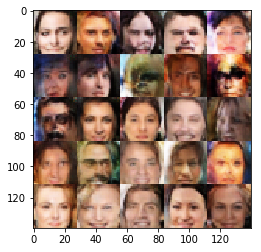

epoch=0 batch=12500 d_loss=0.684045 g_loss=2.67486


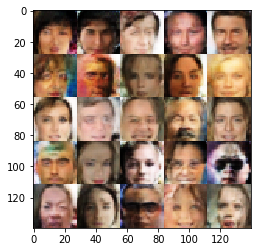

epoch=0 batch=12600 d_loss=0.684503 g_loss=2.66873
Finished


In [76]:
batch_size = 16
z_dim = 100
learning_rate = 0.00010
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.